In [ ]:
import pandas as pd
from keras.models import load_model
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import numpy as np
from utils import load_and_label_data
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report,
    ConfusionMatrixDisplay,
    accuracy_score,
    confusion_matrix,
)
import random
import tensorflow as tf

random.seed(222)
tf.random.set_seed(222)
tf.config.experimental.enable_op_determinism()

# 3. Evaluation

In this notebook, we evaluate our results from our experiments in _2_training_. <br> The notebook has the following subsections:
<a id="first"></a><br> 
[1. Loading the data](#first) <br> 
[2. Vanilla CNN](#second) <br> 
[3. Divide Tasks](#third) <br> 
[4. Inception V3](#fourth) <br> 
[5. Branch CNN](#fifth) <br> 
[6. Conclusion](#sixth)


## Loading the data

In [ ]:
data = pd.read_csv("data.csv")
data = data.assign(label=data["plant"] + "$" + data["disease"])

train = pd.DataFrame()
test = pd.DataFrame()
for label in data["label"].unique():
    data_for_label = data[data["label"] == label].reset_index(drop=True)

    # all data
    train_current_label, rest = train_test_split(data_for_label, test_size=0.1)
    test_current_label, _ = train_test_split(rest, test_size=0.5)

    train = pd.concat([train, train_current_label])
    test = pd.concat([test, test_current_label])

train = shuffle(train, random_state=42)
test = shuffle(test, random_state=42)
print(len(test))
display(test.head(5))

2716


,plant,disease,width,height,color,path,hash,label
407,Corn,Northern_Leaf_Blight,256,256,3,../Plant_leave_diseases_dataset_without_augmen...,fcc107380cef13d6,Corn$Northern_Leaf_Blight
3675,Soybean,healthy,256,256,3,../Plant_leave_diseases_dataset_without_augmen...,fec0810f9c399337,Soybean$healthy
1967,Tomato,Bacterial_spot,256,256,3,../Plant_leave_diseases_dataset_without_augmen...,ef64c04eda1f891c,Tomato$Bacterial_spot
3091,Orange,Haunglongbing_(Citrus_greening),256,256,3,../Plant_leave_diseases_dataset_without_augmen...,db74a9e097855296,Orange$Haunglongbing_(Citrus_greening)
1900,Tomato,Tomato_Yellow_Leaf_Curl_Virus,256,256,3,../Plant_leave_diseases_dataset_without_augmen...,981f6f6430b1c3cb,Tomato$Tomato_Yellow_Leaf_Curl_Virus


Our test set consists of 2,716 samples. Let's prepare our data for prediction.

In [ ]:
X_test, y_test = load_and_label_data(test)

In [ ]:
encoder = OneHotEncoder(sparse_output=False)
encoder_plants = OneHotEncoder(sparse_output=False)
encoder_diseases = OneHotEncoder(sparse_output=False)

encoder_plants.fit(np.array(train["plant"]).reshape(-1, 1))
encoder_diseases.fit(np.array(train["disease"]).reshape(-1, 1))
encoder.fit(np.array(train["label"]).reshape(-1, 1))

OneHotEncoder(sparse_output=False)

## Vanilla CNN <a id="second"></a>
We start by evaluating our "vanilla CNN" that was trained on the whole dataset.

In [ ]:
accuracy_scores = []  # to compare in conclusion

In [ ]:
model = load_model("models/all.h5")

y_pred = model.predict(np.array(X_test))

85/85 [==============================] - 60s 685ms/step


In [ ]:
def evaluate_results(encoder, y_pred, y_test):
    y_pred_decoded = encoder.inverse_transform(y_pred)
    print(classification_report(y_test, y_pred_decoded))
    accuracy_scores.append(
        {"accuracy": accuracy_score(y_test, y_pred_decoded), "model": "Vanilla CNN"}
    )
    cm = confusion_matrix(y_test, y_pred_decoded)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(xticks_rotation=90)
    plt.show()
    return y_pred_decoded

                                             precision    recall  f1-score   support

                           Apple$Apple_scab       1.00      0.90      0.95        31
                            Apple$Black_rot       1.00      0.97      0.98        31
                     Apple$Cedar_apple_rust       0.93      0.93      0.93        14
                              Apple$healthy       0.98      0.96      0.97        82
                          Blueberry$healthy       1.00      0.99      0.99        75
                      Cherry$Powdery_mildew       0.98      1.00      0.99        53
                             Cherry$healthy       0.91      1.00      0.96        43
   Corn$Cercospora_leaf_spot Gray_leaf_spot       0.88      0.81      0.84        26
                           Corn$Common_rust       1.00      1.00      1.00        60
                  Corn$Northern_Leaf_Blight       0.90      0.94      0.92        49
                               Corn$healthy       1.00      1.00

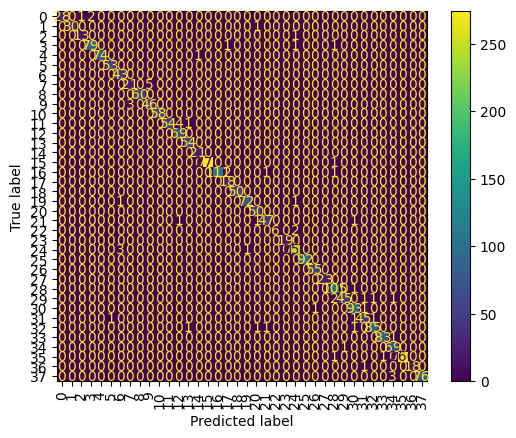

In [ ]:
y_pred_decoded = evaluate_results(encoder, y_pred, y_test)

0.97 accuracy without any hyperparameter tuning seems already pretty good. Based on the classification report, we note that the model achieves the worst f1-score for the class that has the lowest support, healthy potatoes. Furthermore, we note that our model achieves an f1-score > 0.8 for almost all other classes. <br> <br> 
Now, let's look at some of the details of our predictions.

In [ ]:
false_predictions = pd.DataFrame()

for idx in range(len(X_test)):
    if y_pred_decoded[idx] != y_test[idx]:
        pred_split = y_pred_decoded[idx][0].split("$")
        test_split = y_test[idx].split("$")
        false_predictions = pd.concat(
            [
                false_predictions,
                pd.DataFrame(
                    {
                        "plant_pred": [pred_split[0]],
                        "plant_true": [test_split[0]],
                        "disease_pred": [pred_split[1]],
                        "disease_true": [test_split[1]],
                    }
                ),
            ]
        )

        # plt.imshow(X_test[idx])
        # plt.axis("off")
        # plt.suptitle(f"Predicted label: {y_pred_decoded[idx]}, actual label: {y_test[idx]}")
        # plt.show()

true_plant = false_predictions[
    false_predictions["plant_pred"] == false_predictions["plant_true"]
]
true_disease = false_predictions[
    false_predictions["disease_pred"] == false_predictions["disease_true"]
]
print(
    f"From {len(false_predictions)} false predictions, in {len(true_plant)}, the plant was correctly identified. In {len(true_disease)} cases, the disease was correct."
)
display(true_plant["plant_pred"].value_counts())
display(true_disease["disease_pred"].value_counts())

From 61 false predictions, in 37, the plant was correctly identified. In 13 cases, the disease was correct.


plant_pred
Tomato    18
Corn       8
Grape      5
Apple      3
Peach      2
Potato     1
Name: count, dtype: int64

disease_pred
healthy           11
Late_blight        1
Bacterial_spot     1
Name: count, dtype: int64

In the vast majority of cases, our model identified either the plant or the disease correctly. When the plant was correctly classified, our model seemed to have problems with different diseases of tomatoes and corn. When the "disease" was correctly classified, it seems that our model had the biggest problem to distinguish between different kinds of healthy leaves. <br> <br>
Let's look at some of these images. Starting with tomatoes

In [ ]:
wrongly_classified_tomato_diseases = false_predictions[
    (false_predictions["plant_pred"].str.startswith("Tomato"))
    & (false_predictions["plant_true"].str.startswith("Tomato"))
]
display(wrongly_classified_tomato_diseases)
display(wrongly_classified_tomato_diseases["disease_true"].value_counts())

,plant_pred,plant_true,disease_pred,disease_true
0,Tomato,Tomato,Bacterial_spot,Early_blight
0,Tomato,Tomato,Septoria_leaf_spot,Early_blight
0,Tomato,Tomato,Leaf_Mold,Late_blight
0,Tomato,Tomato,Target_Spot,Early_blight
0,Tomato,Tomato,Late_blight,Leaf_Mold
0,Tomato,Tomato,Late_blight,Septoria_leaf_spot
0,Tomato,Tomato,Late_blight,Bacterial_spot
0,Tomato,Tomato,Early_blight,Target_Spot
0,Tomato,Tomato,Target_Spot,healthy
0,Tomato,Tomato,Bacterial_spot,Early_blight


disease_true
Early_blight                            5
healthy                                 3
Leaf_Mold                               2
Tomato_Yellow_Leaf_Curl_Virus           2
Late_blight                             1
Septoria_leaf_spot                      1
Bacterial_spot                          1
Target_Spot                             1
Spider_mites Two-spotted_spider_mite    1
Tomato_mosaic_virus                     1
Name: count, dtype: int64

Looking at wrongly classified tomato diseases, we note that our model commonly confuses early blight. Let's look at some example images

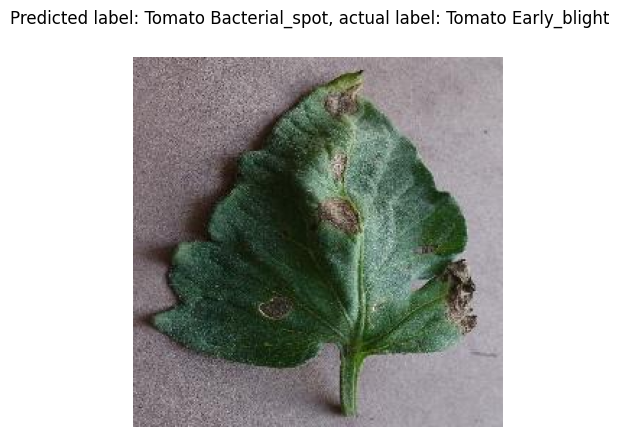

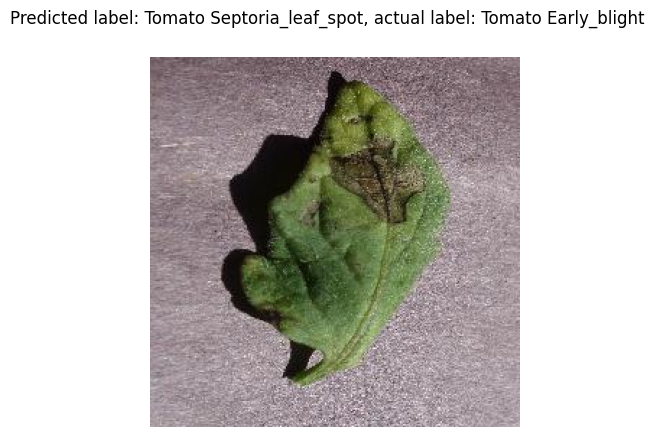

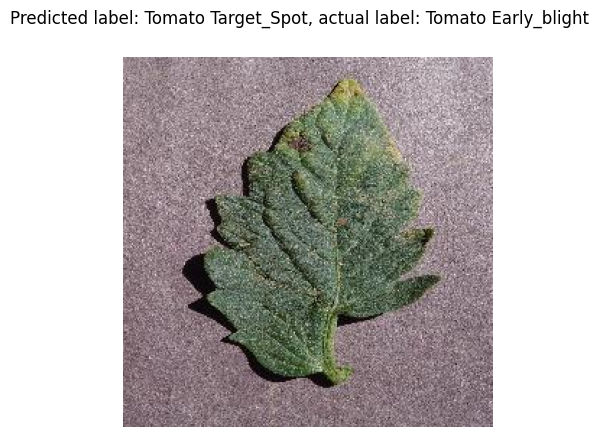

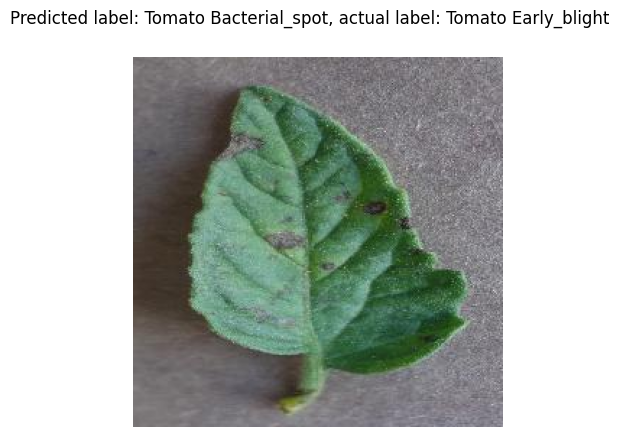

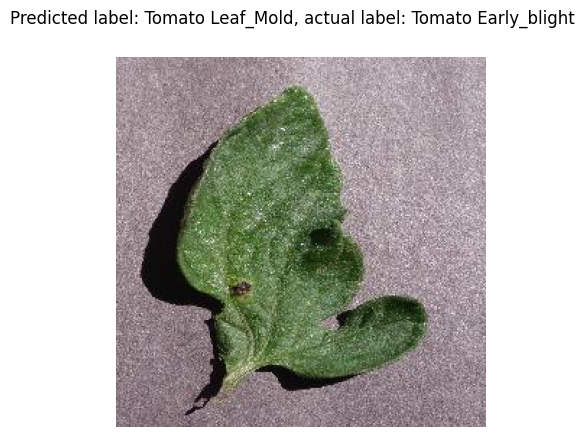

In [ ]:
for idx in range(len(X_test)):
    if y_pred_decoded[idx] != y_test[idx]:
        if (
            y_pred_decoded[idx][0].startswith("Tomato")
            and y_test[idx].startswith("Tomato")
            and y_test[idx].endswith("Early_blight")
        ):
            plt.imshow(X_test[idx])
            plt.axis("off")
            plt.suptitle(
                f"Predicted label: {y_pred_decoded[idx][0].replace('$', ' ')}, actual label: {y_test[idx].replace('$', ' ')}"
            )
            plt.show()

Based on these images, we conclude that it can be hard for our model to distinguish between the different diseases. For further improvements of the model, one might consider "artificially" increasing the support of images of tomato leaves with early blight, as it has a relatively low support (50) when compared against late blight (95) and a bacterial spot (106). This could be done by, e.g., flipping existing images.

Next, we look at wrongly classified corn.

In [ ]:
wrongly_classified_corn_diseases = false_predictions[
    (false_predictions["plant_pred"].str.startswith("Corn"))
    & (false_predictions["plant_true"].str.startswith("Corn"))
]
display(wrongly_classified_corn_diseases)
display(wrongly_classified_corn_diseases["disease_true"].value_counts())

,plant_pred,plant_true,disease_pred,disease_true
0,Corn,Corn,Northern_Leaf_Blight,Cercospora_leaf_spot Gray_leaf_spot
0,Corn,Corn,Northern_Leaf_Blight,Cercospora_leaf_spot Gray_leaf_spot
0,Corn,Corn,Cercospora_leaf_spot Gray_leaf_spot,Northern_Leaf_Blight
0,Corn,Corn,Cercospora_leaf_spot Gray_leaf_spot,Northern_Leaf_Blight
0,Corn,Corn,Northern_Leaf_Blight,Cercospora_leaf_spot Gray_leaf_spot
0,Corn,Corn,Northern_Leaf_Blight,Cercospora_leaf_spot Gray_leaf_spot
0,Corn,Corn,Northern_Leaf_Blight,Cercospora_leaf_spot Gray_leaf_spot
0,Corn,Corn,Cercospora_leaf_spot Gray_leaf_spot,Northern_Leaf_Blight


disease_true
Cercospora_leaf_spot Gray_leaf_spot    5
Northern_Leaf_Blight                   3
Name: count, dtype: int64

Okay, our model commonly confuses gray leaf spots with northern leaf blight. Let's look at some images.

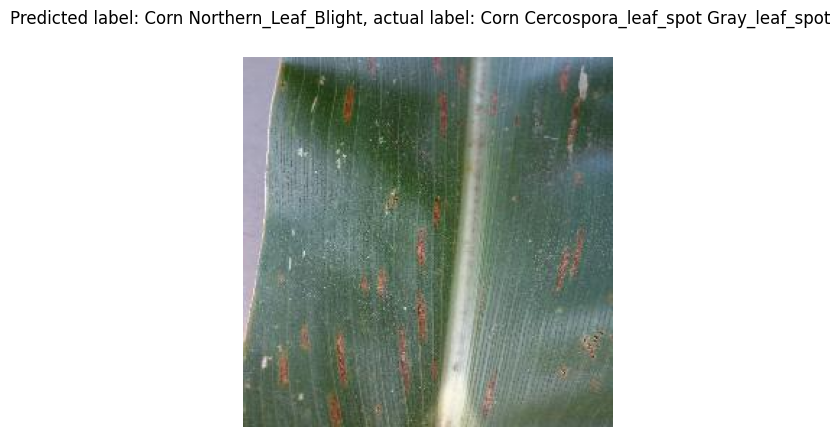

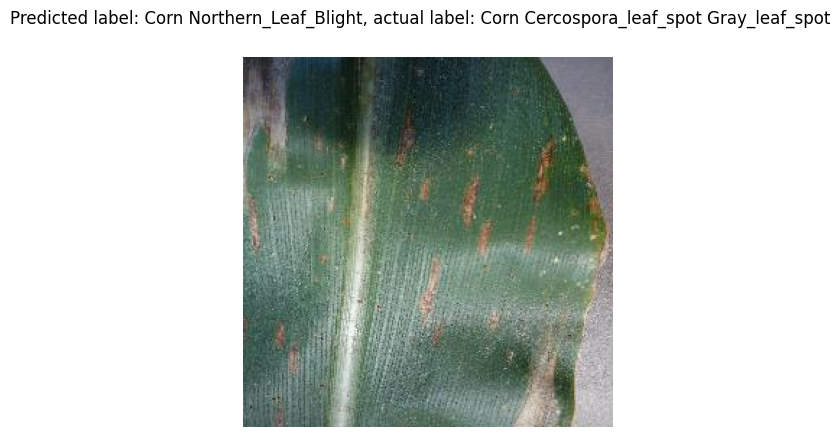

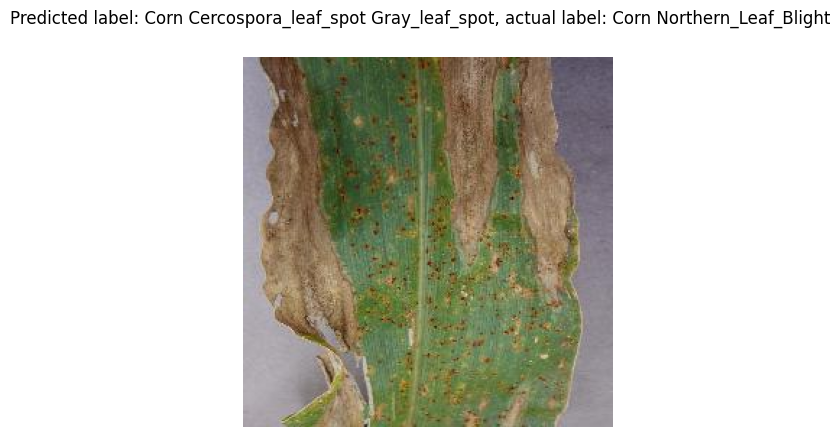

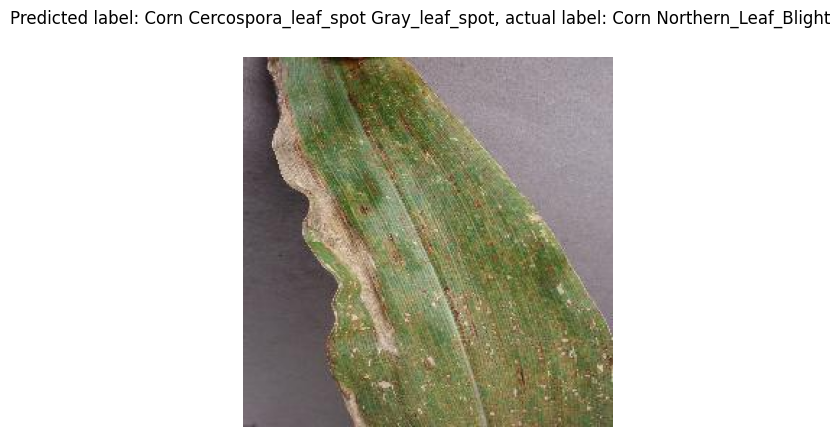

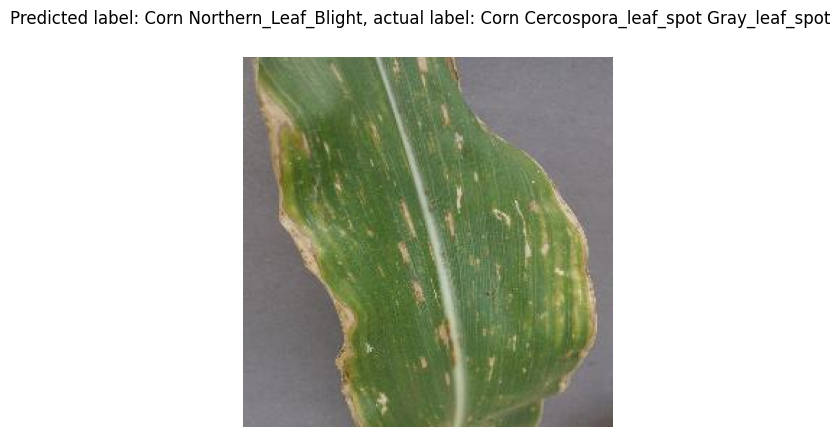

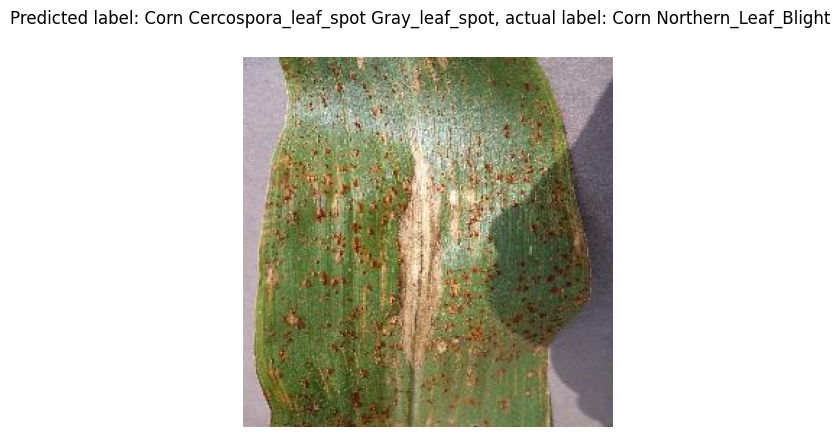

In [ ]:
count_cerco = 0
count_northern = 0
show = False
for idx in range(len(X_test)):
    if y_pred_decoded[idx] != y_test[idx]:
        if y_pred_decoded[idx][0].startswith("Corn") and y_test[idx].startswith("Corn"):
            if (
                y_test[idx].endswith("Cercospora_leaf_spot Gray_leaf_spot")
                and count_cerco < 3
            ):
                count_cerco += 1
                show = True
            if y_test[idx].endswith("Northern_Leaf_Blight") and count_northern < 3:
                count_northern += 1
                show = True
            if show == True:
                plt.imshow(X_test[idx])
                plt.axis("off")
                plt.suptitle(
                    f"Predicted label: {y_pred_decoded[idx][0].replace('$', ' ')}, actual label: {y_test[idx].replace('$', ' ')}"
                )
                plt.show()
                show = False

Even as a human, these diseases look similar (disclaimer: opinionated), and it can be hard for the model to distinguish between one another. <br> <br> 

The most common "disease" that was misclassified were healthy leaves. Let's also take a look into these misclassified samples.

In [ ]:
wrongly_classified_healthy_leaves = false_predictions[
    (false_predictions["disease_pred"] == "healthy")
    & (false_predictions["disease_true"] == "healthy")
]
display(wrongly_classified_healthy_leaves)

,plant_pred,plant_true,disease_pred,disease_true
0,Soybean,Potato,healthy,healthy
0,Cherry,Soybean,healthy,healthy
0,Grape,Blueberry,healthy,healthy
0,Soybean,"Pepper,_bell",healthy,healthy
0,"Pepper,_bell",Soybean,healthy,healthy
0,Cherry,Soybean,healthy,healthy
0,Soybean,Apple,healthy,healthy
0,Soybean,Potato,healthy,healthy
0,Peach,Apple,healthy,healthy
0,Cherry,Soybean,healthy,healthy


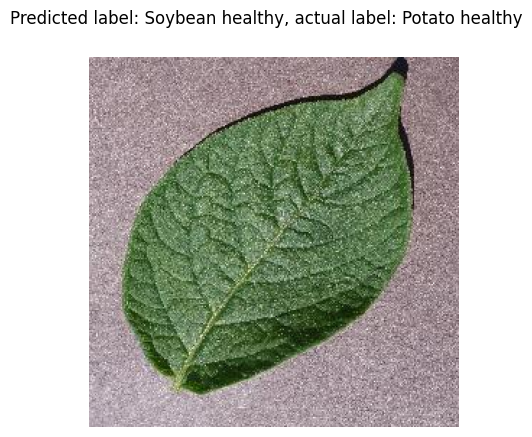

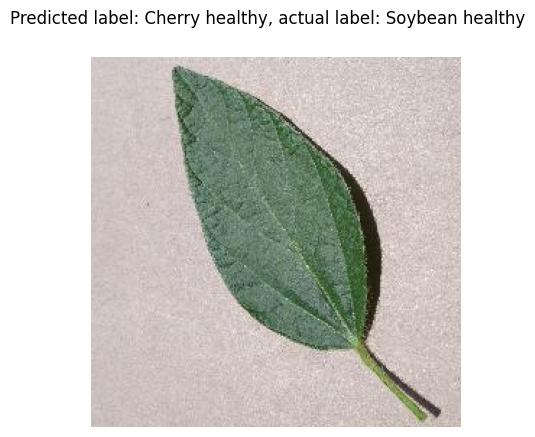

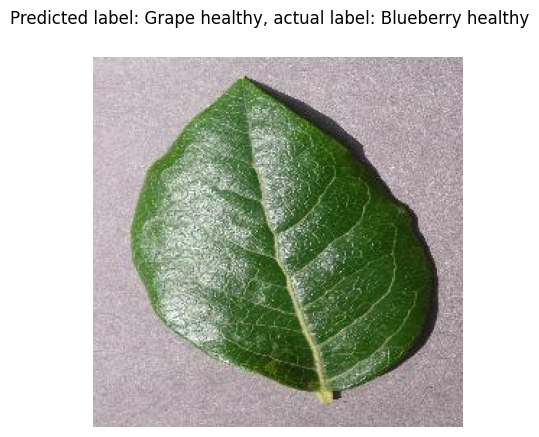

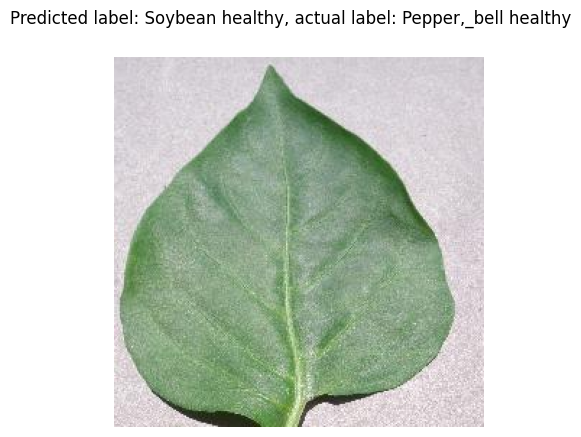

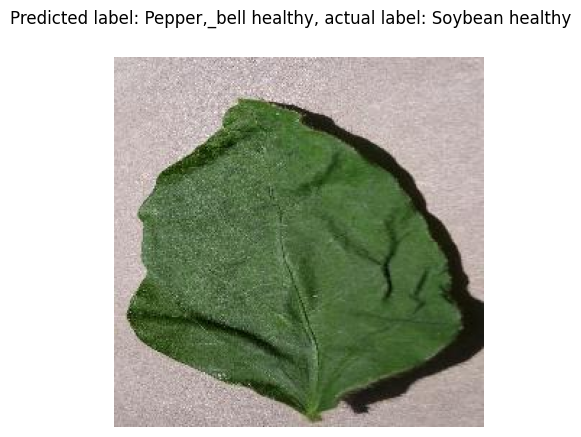

...

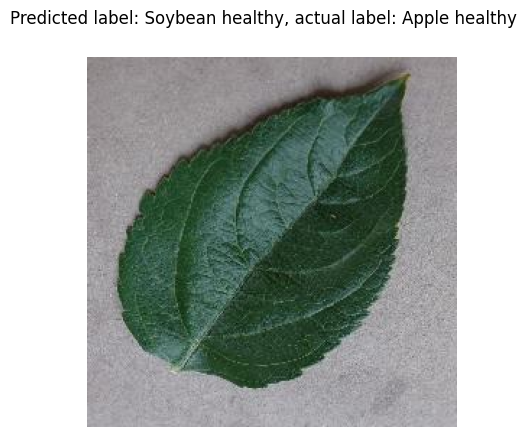

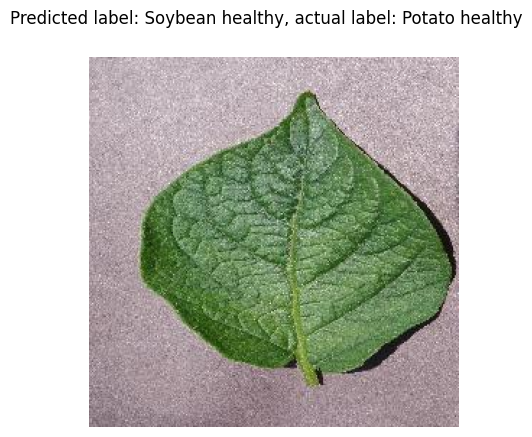

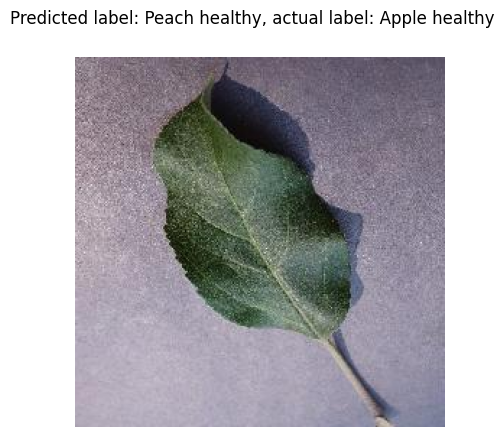

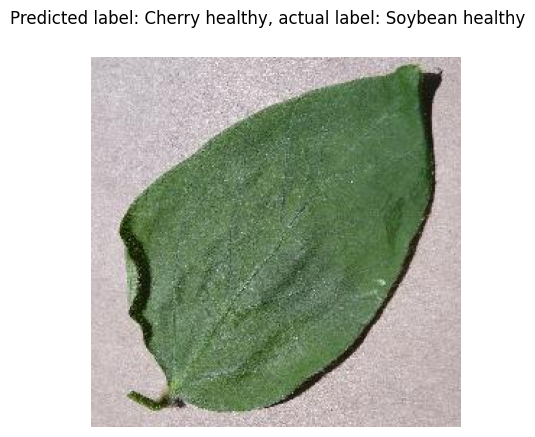

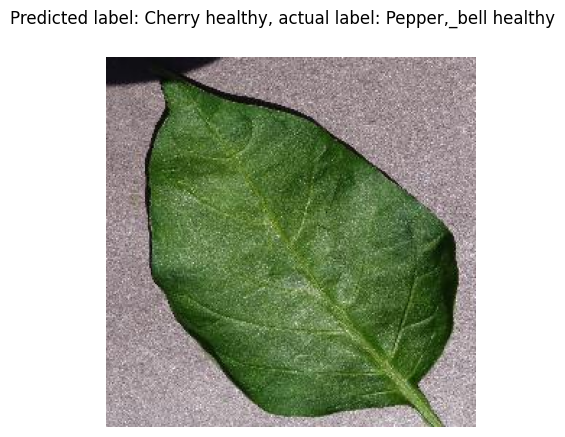

In [ ]:
for idx in range(len(X_test)):
    if y_pred_decoded[idx] != y_test[idx]:
        if y_pred_decoded[idx][0].endswith("healthy") and y_test[idx].endswith(
            "healthy"
        ):
            plt.imshow(X_test[idx])
            plt.axis("off")
            plt.suptitle(
                f"Predicted label: {y_pred_decoded[idx][0].replace('$', ' ')}, actual label: {y_test[idx].replace('$', ' ')}"
            )
            plt.show()

We note that there is one image that does not contain any leaf. Other than that, similar to the wrongly predicted diseases, some of the leaves are hard to distinguish, even for humans. Furthermore, the light conditions change between the images, which compilicates the task. With this, we conclude the evaluation of our first model. To summarize:
- 0.97 is already a good score
- out of the wrongly classified images, many of the respective diseases / plants look similar
- the dataset still contains at least one image that we consider as noise, since it does not show anything

## Divide Tasks <a id="third"></a>

Next, we evaluate our two models that were trained on the subtasks "plant prediction" and "disease prediction"

In [ ]:
_, y_test_plants = load_and_label_data(test, "plant")
_, y_test_diseases = load_and_label_data(test, "disease")

In [ ]:
model_plants = load_model("models/plant_all.h5")
model_diseases = load_model("models/disease_all.h5")
y_pred_plants = model_plants.predict(np.array(X_test))
y_pred_diseases = model_diseases.predict(np.array(X_test))

85/85 [==============================] - 85s 875ms/step


              precision    recall  f1-score   support

       Apple       0.99      0.96      0.97       158
   Blueberry       1.00      1.00      1.00        75
      Cherry       1.00      0.99      0.99        96
        Corn       1.00      0.99      1.00       193
       Grape       1.00      0.98      0.99       203
      Orange       0.99      1.00      0.99       275
       Peach       0.98      0.99      0.99       133
Pepper,_bell       0.98      0.99      0.98       124
      Potato       0.99      0.97      0.98       108
   Raspberry       0.86      1.00      0.93        19
     Soybean       0.99      1.00      0.99       254
      Squash       0.99      1.00      0.99        92
  Strawberry       0.99      1.00      0.99        78
      Tomato       0.99      0.99      0.99       908

    accuracy                           0.99      2716
   macro avg       0.98      0.99      0.99      2716
weighted avg       0.99      0.99      0.99      2716



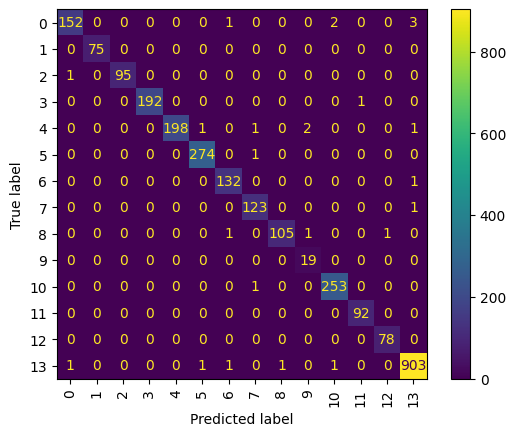

In [ ]:
y_pred_decoded_plants = evaluate_results(encoder_plants, y_pred_plants, y_test_plants)

Our model for plant prediction achieves an accuracy of 0.99, which is already quite qood. Let's check which plant is wrongly classified the most frequently.

In [ ]:
false = pd.DataFrame()

for i in range(len(X_test)):
    if y_pred_decoded_plants[i][0] != y_test_plants[i]:
        false = pd.concat(
            [pd.DataFrame({"pred": y_pred_decoded_plants[i], "true": y_test[i]}), false]
        )
display(false["true"].value_counts())

true
Apple$healthy                                  5
Grape$healthy                                  2
Potato$healthy                                 2
Peach$Bacterial_spot                           1
Grape$Leaf_blight_(Isariopsis_Leaf_Spot)       1
Potato$Late_blight                             1
Tomato$Target_Spot                             1
Pepper,_bell$healthy                           1
Tomato$Tomato_Yellow_Leaf_Curl_Virus           1
Tomato$Septoria_leaf_spot                      1
Soybean$healthy                                1
Orange$Haunglongbing_(Citrus_greening)         1
Tomato$Spider_mites Two-spotted_spider_mite    1
Apple$Apple_scab                               1
Grape$Esca_(Black_Measles)                     1
Tomato$Late_blight                             1
Grape$Black_rot                                1
Cherry$healthy                                 1
Corn$Northern_Leaf_Blight                      1
Name: count, dtype: int64

Okay, so apples lead to the most misclassifications. How do the wrongly classified images look like?

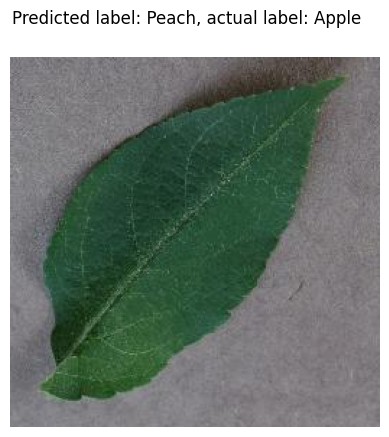

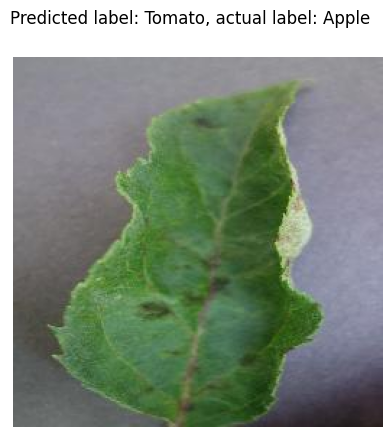

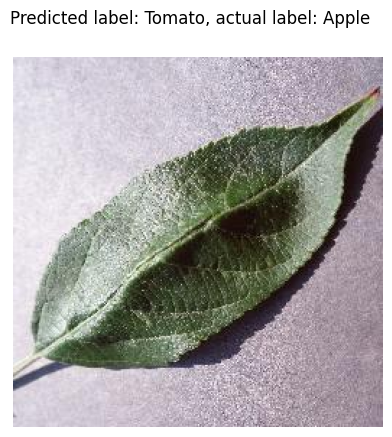

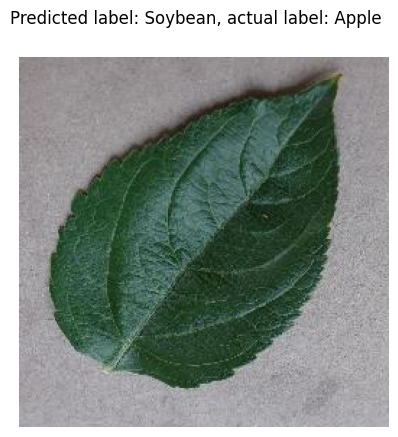

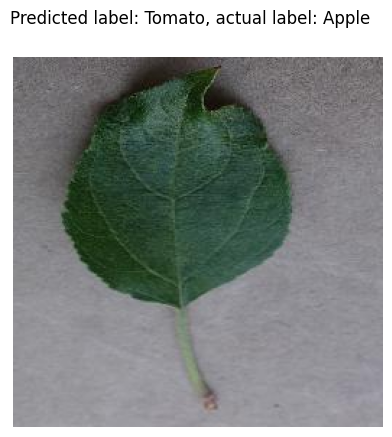

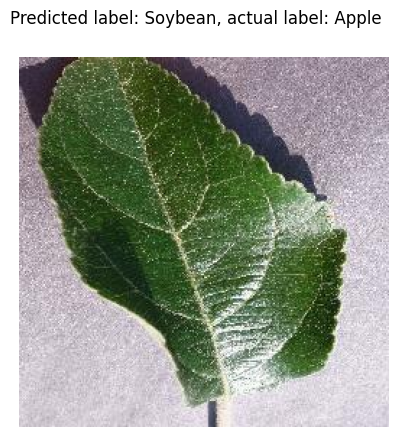

In [ ]:
for idx in range(len(X_test)):
    if y_pred_decoded_plants[idx][0] != "Apple" and y_test_plants[idx] == "Apple":
        plt.imshow(X_test[idx])
        plt.axis("off")
        plt.suptitle(
            f"Predicted label: {y_pred_decoded_plants[idx][0]}, actual label: {y_test_plants[idx]}"
        )
        plt.show()

Based on the above images, we note that our model has a tendency to confuse other leaves with apple leaves.

Next, we check the results of our disease prediction model. Similar to before, we first take a look at the overall accuracy and then analyze false predictions.

                                      precision    recall  f1-score   support

                          Apple_scab       1.00      0.97      0.98        31
                      Bacterial_spot       0.99      0.99      0.99       271
                           Black_rot       0.99      0.99      0.99        90
                    Cedar_apple_rust       1.00      0.93      0.96        14
 Cercospora_leaf_spot Gray_leaf_spot       0.89      0.96      0.93        26
                         Common_rust       1.00      1.00      1.00        60
                        Early_blight       0.94      0.98      0.96       100
                Esca_(Black_Measles)       1.00      1.00      1.00        69
     Haunglongbing_(Citrus_greening)       1.00      1.00      1.00       275
                         Late_blight       0.98      0.94      0.96       145
                           Leaf_Mold       0.98      0.98      0.98        48
  Leaf_blight_(Isariopsis_Leaf_Spot)       0.98      1.00      

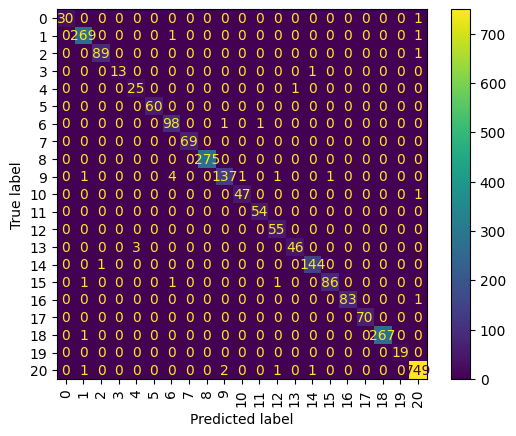

In [ ]:
y_pred_decoded_diseases = evaluate_results(
    encoder_diseases, y_pred_diseases, y_test_diseases
)

An accuracy of 0.99 seems reasonable. 

In [ ]:
false_diseases = pd.DataFrame()

for i in range(len(X_test)):
    if y_pred_decoded_diseases[i][0] != y_test_diseases[i]:
        false_diseases = pd.concat(
            [
                pd.DataFrame(
                    {"pred": y_pred_decoded_diseases[i], "true": y_test_diseases[i]}
                ),
                false_diseases,
            ]
        )
display(false_diseases["true"].value_counts())

true
Late_blight                             8
healthy                                 5
Septoria_leaf_spot                      3
Northern_Leaf_Blight                    3
Bacterial_spot                          2
Early_blight                            2
Cercospora_leaf_spot Gray_leaf_spot     1
Cedar_apple_rust                        1
Spider_mites Two-spotted_spider_mite    1
Tomato_Yellow_Leaf_Curl_Virus           1
Apple_scab                              1
Powdery_mildew                          1
Black_rot                               1
Leaf_Mold                               1
Name: count, dtype: int64

Similar to the model that predicted disease and plant together, our model which focused only on diseases has a problem to distinguish between different types of blight.

In [ ]:
print(f"Out of {len(false_diseases)} diseases")
print(
    len(false_diseases[false_diseases["true"].str.lower().str.endswith("blight")]),
    "are some form of blight",
)

Out of 31 diseases
13 are some form of blight


I.e. approx. 1/3 of the misclassified samples suffer from blight. As we analyzed before, the different forms of blight can appear very similar. E.g., based on our results from the first model, we found that there is a fine line between early and late blight for tomatoes. <br> <br>
We now combine the two predictions from our models and check the overall accuracy.

In [ ]:
y_pred_combined = [
    plant[0] + "$" + disease[0]
    for plant, disease in zip(y_pred_decoded_plants, y_pred_decoded_diseases)
]
accuracy_scores.append(
    {"accuracy": accuracy_score(y_test, y_pred_combined), "model": "Divide tasks"}
)
print(classification_report(y_test, y_pred_combined))

                                              precision    recall  f1-score   support

                            Apple$Apple_scab       1.00      0.94      0.97        31
                             Apple$Black_rot       1.00      0.97      0.98        31
                      Apple$Cedar_apple_rust       1.00      0.93      0.96        14
                        Apple$Powdery_mildew       0.00      0.00      0.00         0
                           Apple$Target_Spot       0.00      0.00      0.00         0
                               Apple$healthy       0.96      0.94      0.95        82
                           Blueberry$healthy       1.00      1.00      1.00        75
                            Cherry$Black_rot       0.00      0.00      0.00         0
                       Cherry$Powdery_mildew       1.00      0.98      0.99        53
                              Cherry$healthy       1.00      0.98      0.99        43
    Corn$Cercospora_leaf_spot Gray_leaf_spot       0.

c:\Users\I567766\industrial_applications_of_ai\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\I567766\industrial_applications_of_ai\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\I567766\industrial_applications_of_ai\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

Interesting! Even though our combined models "hallucinates" some new disease-plant combinations that do not actually exist in the dataset, the overall accuracy better than the model that predicts plant and disease together (0.98 instead of 0.97).

## Inception V3 <a id="fourth"></a>

Now, we evaluate the model that used inceptionv3 as fixed feature extractor.

In [ ]:
inception = load_model("models/inception_all.h5")

y_pred_inception = inception.predict(np.array(X_test))

85/85 [==============================] - 244s 3s/step


                                             precision    recall  f1-score   support

                           Apple$Apple_scab       0.96      0.87      0.92        31
                            Apple$Black_rot       0.91      0.97      0.94        31
                     Apple$Cedar_apple_rust       0.33      1.00      0.50        14
                              Apple$healthy       0.91      0.95      0.93        82
                          Blueberry$healthy       1.00      0.99      0.99        75
                      Cherry$Powdery_mildew       0.98      0.89      0.93        53
                             Cherry$healthy       1.00      0.86      0.93        43
   Corn$Cercospora_leaf_spot Gray_leaf_spot       0.84      0.81      0.82        26
                           Corn$Common_rust       0.97      1.00      0.98        60
                  Corn$Northern_Leaf_Blight       0.93      0.88      0.91        49
                               Corn$healthy       1.00      0.98

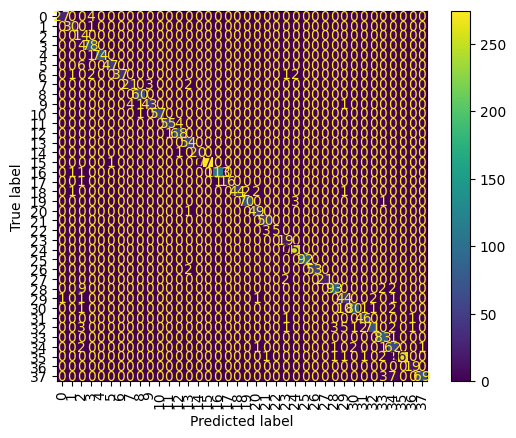

In [ ]:
y_pred_decoded_inception = evaluate_results(encoder, y_pred_inception, y_test)
accuracy_scores.append(
    {
        "accuracy": accuracy_score(y_test, y_pred_decoded_inception),
        "model": "Inception V3",
    }
)

With an accuracy of 0.95, Inception V3 yields the worst performance so far. While the overall results look relatively good (almost all classes have f1-score > 0.8), we note that the model has problems with the samples of the _Apple$Cedar_apple_rustic_ class. Let's look at some of the samples.

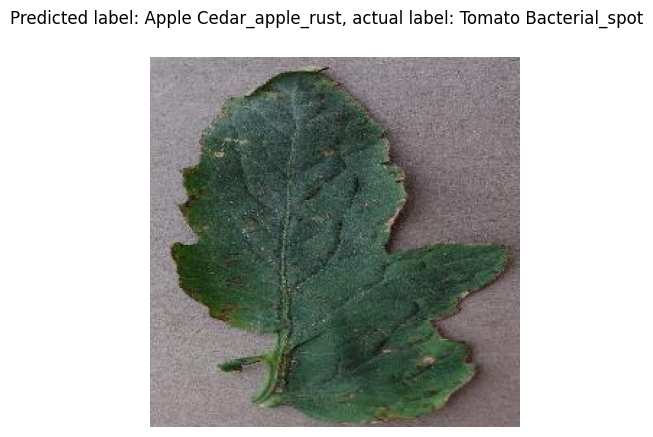

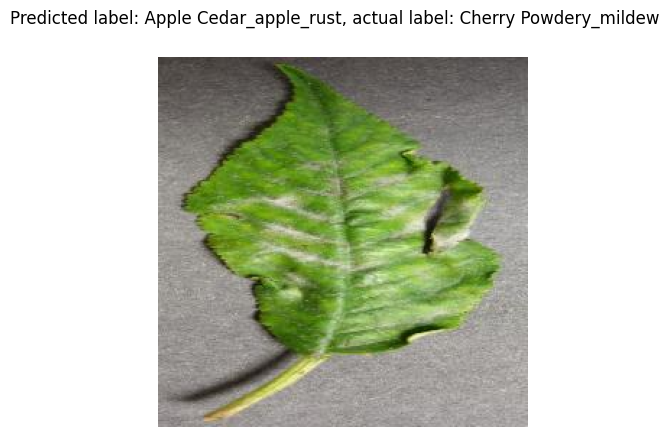

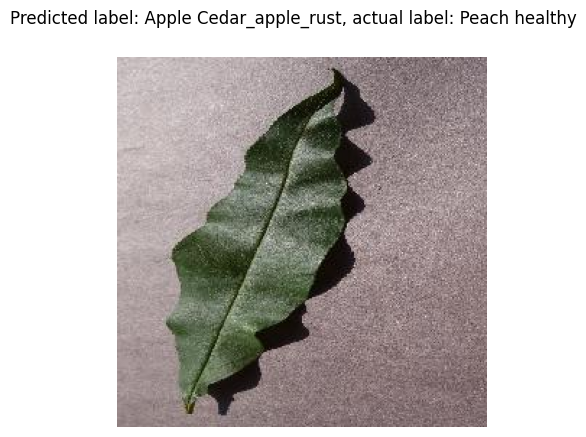

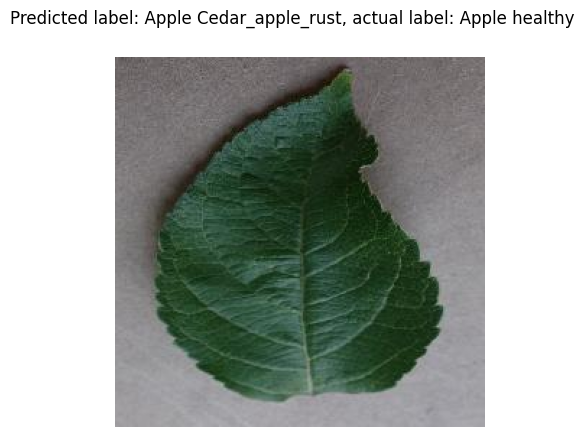

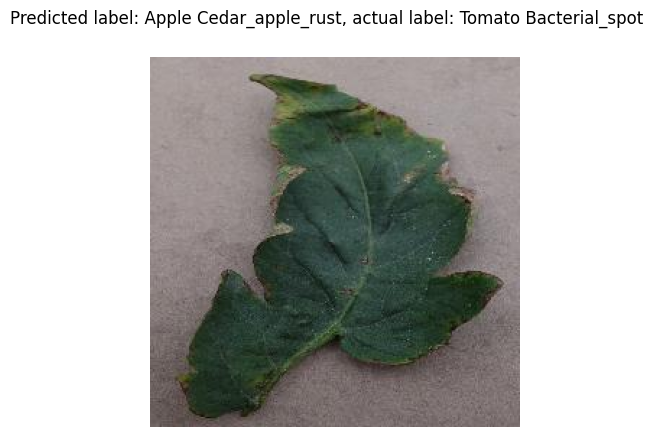

...

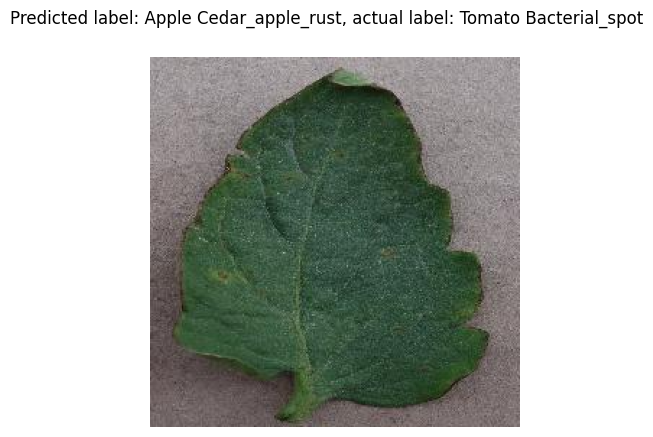

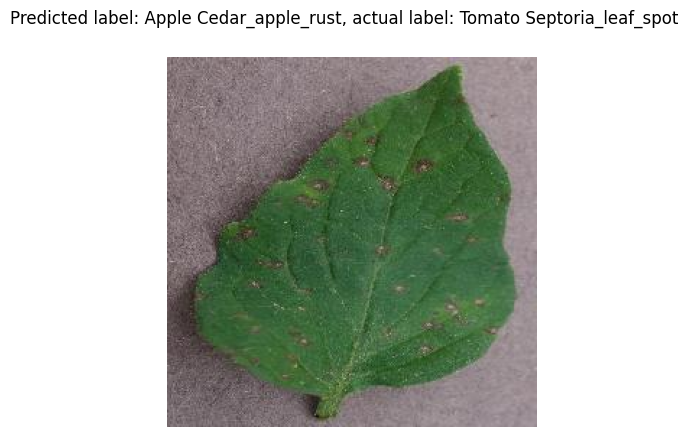

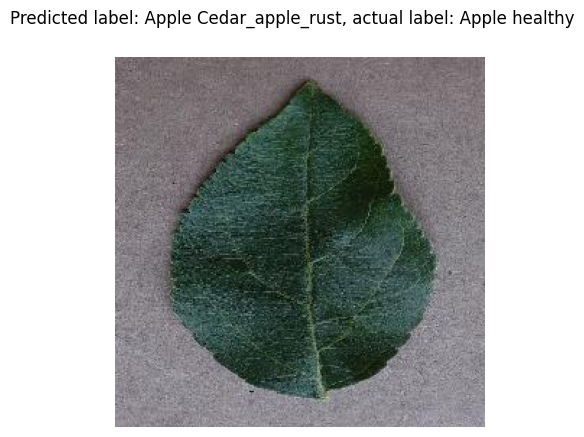

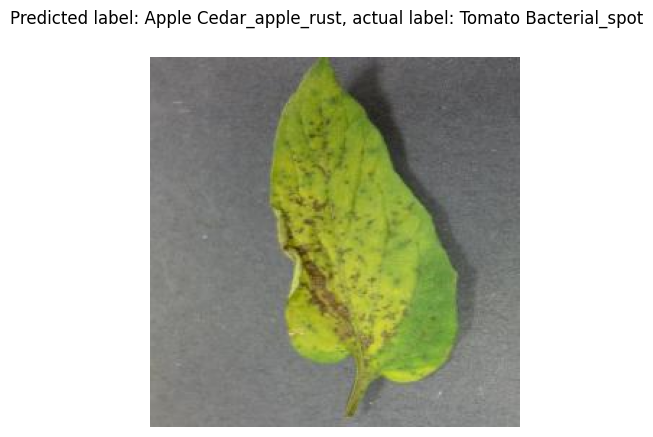

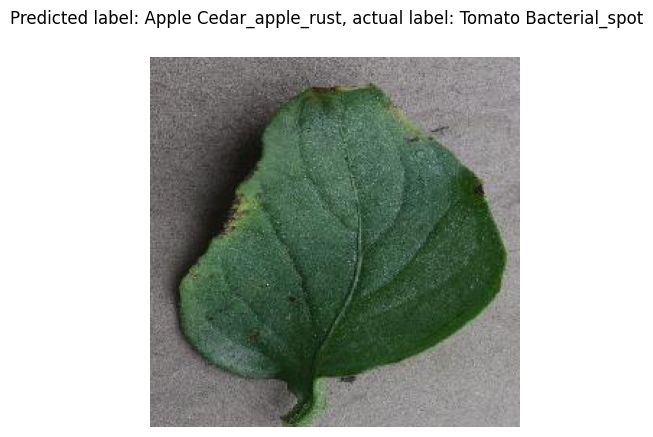

In [ ]:
for idx in range(len(X_test)):
    if y_pred_decoded_inception[idx] != y_test[idx]:
        if y_pred_decoded_inception[idx][0].endswith("Cedar_apple_rust") or y_test[
            idx
        ].endswith("Cedar_apple_rust"):
            plt.imshow(X_test[idx])
            plt.axis("off")
            plt.suptitle(
                f"Predicted label: {y_pred_decoded_inception[idx][0].replace('$', ' ')}, actual label: {y_test[idx].replace('$', ' ')}"
            )
            plt.show()

Interesting! While the misclassified samples we previously analyzed from our previous models looked rather explainable, we note that these leaves do not appear similar, although our model assigns the same label to all of them. 

In [ ]:
print(accuracy_scores)

[{'accuracy': 0.9701767304860088, 'model': 'Vanilla CNN'}, {'accuracy': 0.9907952871870398, 'model': 'Vanilla CNN'}, {'accuracy': 0.9885861561119293, 'model': 'Vanilla CNN'}, {'accuracy': 0.9815905743740795, 'model': 'Divide tasks'}, {'accuracy': 0.9473490427098674, 'model': 'Vanilla CNN'}, {'accuracy': 0.9473490427098674, 'model': 'Inception V3'}, {'accuracy': 0.6369661266568483, 'model': 'Vanilla CNN'}, {'accuracy': 0.6369661266568483, 'model': 'Transfer'}, {'accuracy': 0.6369661266568483, 'model': 'Vanilla CNN'}, {'accuracy': 0.6369661266568483, 'model': 'Transfer'}]
